In [63]:
import deepxde as dde
from deepxde.backend import pytorch
import torch
import matplotlib.pyplot as plt
import numpy as np

from SIRD_deepxde_DiseaseModel import SIRD_deepxde_net
from DiseaseModel import SIR,SIRD,SIRDIm,SIRImRel, SIRDImRel, SIRD2Var, SIRD2VarRelSimple, GeneralModelSolver
from Plot import Plot

# %matplotlib widget

seed = 2
np.random.seed(seed)
dde.config.set_random_seed(seed)

In [64]:
sol_data = np.load("SIRD_sim_data_S10k_I1.npy") * 100
t_data = np.arange(len(sol_data))


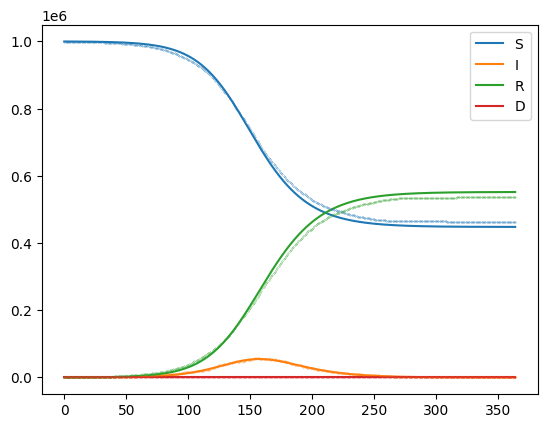

In [66]:
time_delta = [0,365] # use three values here for intro time of second variant


initial_conditions = {
    "S": 1000000,
    "I": 100,
    "R": 0,
    "D": 0,
    }
static_parameters = {
    "alpha": 0.16,
    "beta": 0.11,
    "gamma": 0.00,
    }
sird_model = SIRD(initial_conditions, static_parameters, time_delta)


t_synth, solution_synth_full = sird_model.simulate()
t_synth, solution_synth = t_data, sol_data
# sird_model.plot_solution()
sird_model.plot_sird()
plt.plot(t_data,sol_data, ls='', marker='.', markersize=0.5)


In [67]:
print(sird_model)


A Disease Model with description: 'The standard SIRD model with Susceptible, Infection, and Removed, and alpha, beta, gamma as static parameters':
Parameters:
	alpha = 0.16
	beta = 0.11
	gamma = 0.0

PDE groups and initial conditions:
	S = 1000000
	I = 100
	R = 0
	D = 0

PDE equations:
 	dS/dt = -((alpha)/N)*I*S
	dI/dt = ((alpha)/N)*S*I - (beta)*I - (gamma)*I
	dR/dt = (beta)*I 
	dD/dt = (gamma)*I
PINN PDE loss equations:
	dS_t - (-((alpha)/N)*I*S)
	dI_t - (((alpha)/N)*S*I - (beta)*I - (gamma)*I)
	dR_t - ((beta)*I )
	dD_t - ((gamma)*I)


In [68]:
# keep this even if not subsetting
t = t_synth
wsol = solution_synth

sird_model.add_solver(GeneralModelSolver)
# solver = GeneralModelSolver(sird_model)
# subset
# max_timestep = 300
# t_bool = t_synth < max_timestep
# t = t_synth[t_bool]
# wsol = wsol_synth[t_bool]

In [71]:
# model = SIRD_deepxde_net(t, wsol,disease_model=sird_model, with_neumann=False, model_name="diseasemodel_test", with_softadapt=False)
model = SIRD_deepxde_net(t, wsol, disease_model=sird_model,  model_name="diseasemodel_simulated_data", with_softadapt=False,
                        with_neumann=False, # important for peak prediction
                        use_ln_space=False,
                        use_ic_loss=True,
                        use_observe_loss=True,
                        use_observe_I_loss=False,
                        use_observe_sum_loss=False,
                        use_sign_loss=False,
                        use_smooth_loss=False,
                        use_initL1_loss=False,
                        use_infectedL1_loss=False,)

model.set_synthetic_data(t_synth, solution_synth)

print(model)
hyper_print_every = 2000
static_loss_weights = []
for key in (model.PDE_names + list(model.loss_points_dict.keys())):
    w = 1
    # if "d" in key and "_t" in key:
    #     w = 0.1
    # elif "observe_I" in key:
    #     w = 2
    # elif "ic" in key:
    #     w = 0.5
    # else:
    #     w = 0.1
    static_loss_weights.append(w)
model.init_model(lr=0.01, print_every=hyper_print_every, activation="tanh", loss="MSE", nn_layers=2, nn_layer_width=32, loss_weights=static_loss_weights)
print(static_loss_weights)



PINN model:
Parameters: ['alpha', 'beta', 'gamma']
Loss measures: ['dS_t ', 'dI_t ', 'dR_t ', 'dD_t ', 'ic_I', 'ic_R', 'ic_D', 'ic_S', 'observe_S', 'observe_I', 'observe_R', 'observe_D']
Compiling model...
'compile' took 0.000050 s

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


Training model...

Step      Train loss                                                                                                                  Test loss                                                                                                                   Test metric
0         [3.10e-03, 3.33e-02, 1.33e-02, 6.16e-04, 0.00e+00, 0.00e+00, 0.00e+00, 1.00e+00, 1.06e+00, 1.38e+00, 3.14e-01, 6.17e-03]    [3.10e-03, 3.33e-02, 1.33e-02, 6.16e-04, 0.00e+00, 0.00e+00, 0.00e+00, 1.00e+00, 1.06e+00, 1.38e+00, 3.14e-01, 6.17e-03]    []  
2000      [9.82e-07, 5.26e-07, 6.88e-07, 8.79e-08, 8.48e-07, 7.33e-07, 1.71e-06, 1.44e-07, 2.67e-04, 9.97e-05, 3.82e-04, 4.11e-05]    [9.82e-07, 5.26e-07, 6.88e-07, 8.79e-08, 8.48e-07, 7.33e-07, 1.71e-06, 1.44e-07, 2.67e-04, 9.97e-05, 3.82e-04, 4.11e-05]    []  

Best model at step 1986:
  train loss: 2.98e-04
  test loss: 2.98e-04
  test metric: []

'train' took 14.812644 s

Best train step: 1986
alpha: 0.092831388116
beta: 0.07606266439
gamma

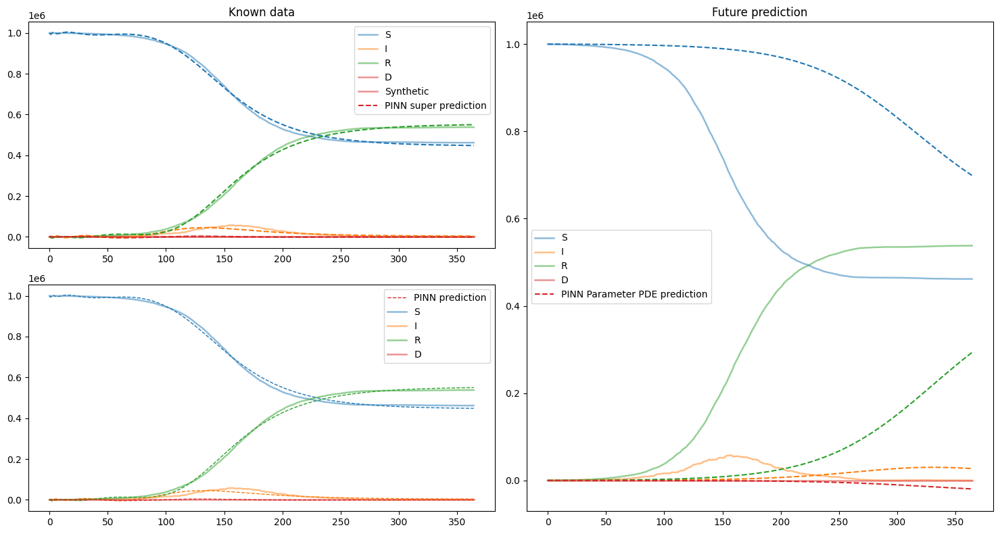

In [72]:
model.intermediate_train(reset=True)

Training model...

Step      Train loss                                                                                                                  Test loss                                                                                                                   Test metric
2000      [9.82e-07, 5.26e-07, 6.88e-07, 8.79e-08, 8.48e-07, 7.33e-07, 1.71e-06, 1.44e-07, 2.67e-04, 9.97e-05, 3.82e-04, 4.11e-05]    [9.82e-07, 5.26e-07, 6.88e-07, 8.79e-08, 8.48e-07, 7.33e-07, 1.71e-06, 1.44e-07, 2.67e-04, 9.97e-05, 3.82e-04, 4.11e-05]    []  
4000      [8.78e-07, 1.39e-07, 6.80e-07, 1.67e-07, 1.21e-05, 5.07e-06, 8.04e-05, 1.58e-05, 5.20e-04, 3.61e-05, 6.27e-04, 8.84e-05]    [8.78e-07, 1.39e-07, 6.80e-07, 1.67e-07, 1.21e-05, 5.07e-06, 8.04e-05, 1.58e-05, 5.20e-04, 3.61e-05, 6.27e-04, 8.84e-05]    []  

Best model at step 3969:
  train loss: 5.84e-05
  test loss: 5.84e-05
  test metric: []

'train' took 15.150638 s

Best train step: 3969
alpha: 0.11414660513
beta: 0.084158293903
gamma

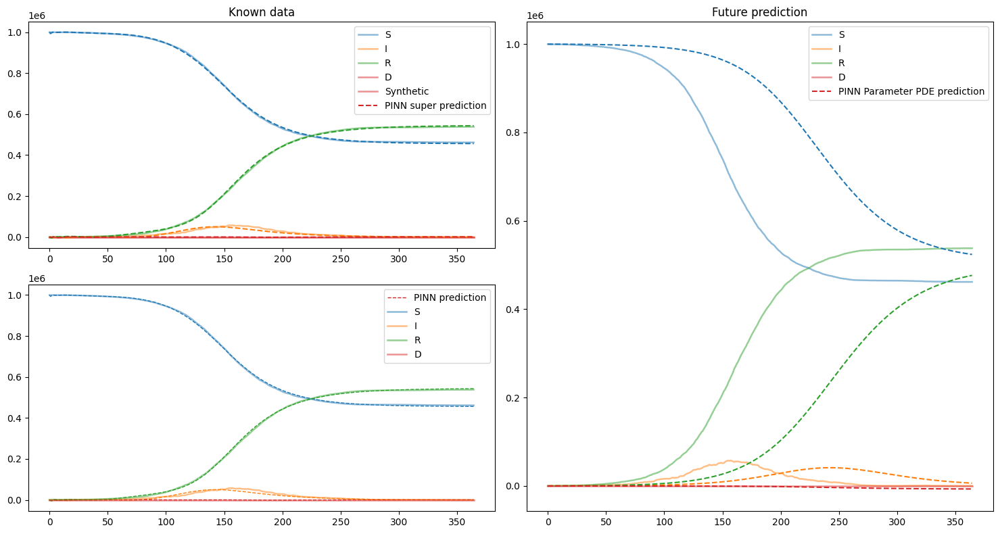

In [73]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                  Test loss                                                                                                                   Test metric
4000      [8.78e-07, 1.39e-07, 6.80e-07, 1.67e-07, 1.21e-05, 5.07e-06, 8.04e-05, 1.58e-05, 5.20e-04, 3.61e-05, 6.27e-04, 8.84e-05]    [8.78e-07, 1.39e-07, 6.80e-07, 1.67e-07, 1.21e-05, 5.07e-06, 8.04e-05, 1.58e-05, 5.20e-04, 3.61e-05, 6.27e-04, 8.84e-05]    []  
6000      [8.63e-07, 2.37e-07, 8.05e-07, 2.82e-08, 2.20e-06, 3.67e-07, 1.10e-05, 5.58e-07, 1.89e-04, 7.54e-05, 3.31e-04, 1.47e-06]    [8.63e-07, 2.37e-07, 8.05e-07, 2.82e-08, 2.20e-06, 3.67e-07, 1.10e-05, 5.58e-07, 1.89e-04, 7.54e-05, 3.31e-04, 1.47e-06]    []  

Best model at step 5979:
  train loss: 2.80e-05
  test loss: 2.80e-05
  test metric: []

'train' took 15.295292 s

Best train step: 5979
alpha: 0.12923006713
beta: 0.092308990657
gamma

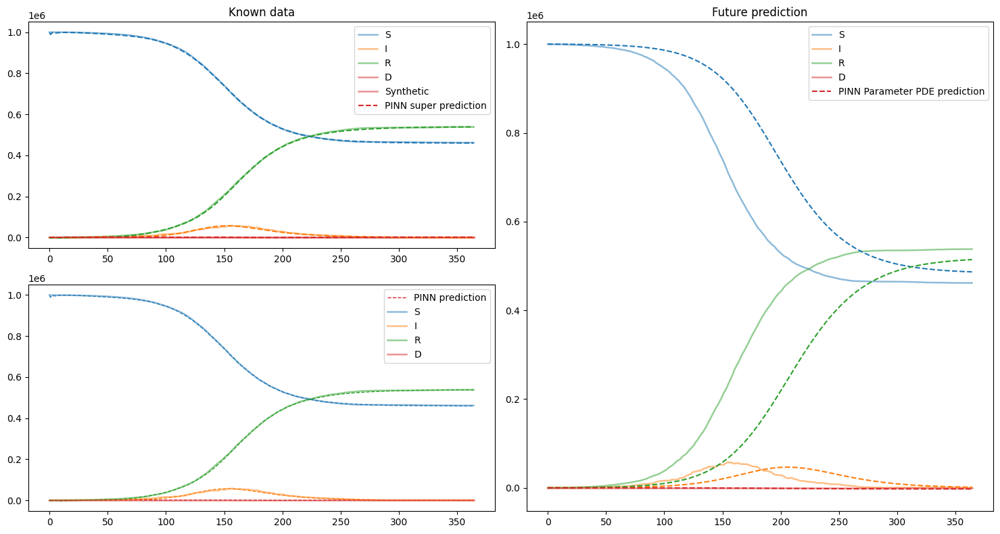

In [74]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                  Test loss                                                                                                                   Test metric
6000      [8.63e-07, 2.37e-07, 8.05e-07, 2.82e-08, 2.20e-06, 3.67e-07, 1.10e-05, 5.58e-07, 1.89e-04, 7.54e-05, 3.31e-04, 1.47e-06]    [8.63e-07, 2.37e-07, 8.05e-07, 2.82e-08, 2.20e-06, 3.67e-07, 1.10e-05, 5.58e-07, 1.89e-04, 7.54e-05, 3.31e-04, 1.47e-06]    []  
8000      [3.17e-07, 3.74e-08, 2.87e-07, 5.19e-08, 5.62e-06, 6.92e-07, 2.22e-06, 1.34e-05, 5.39e-05, 4.40e-06, 5.42e-05, 6.13e-06]    [3.17e-07, 3.74e-08, 2.87e-07, 5.19e-08, 5.62e-06, 6.92e-07, 2.22e-06, 1.34e-05, 5.39e-05, 4.40e-06, 5.42e-05, 6.13e-06]    []  

Best model at step 7040:
  train loss: 1.28e-05
  test loss: 1.28e-05
  test metric: []

'train' took 14.401199 s

Best train step: 7040
alpha: 0.1331115365
beta: 0.093895442784
gamma:

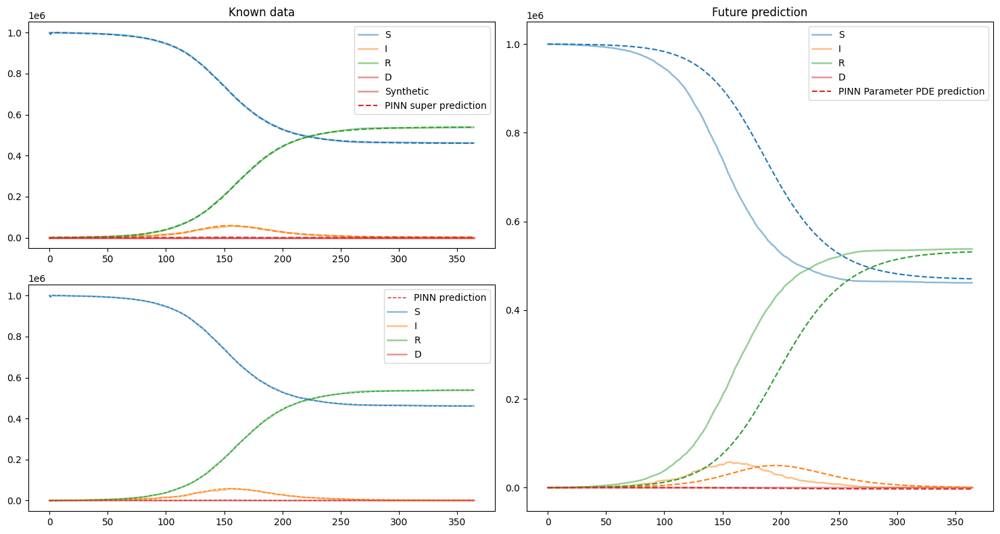

In [75]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                  Test loss                                                                                                                   Test metric
8000      [3.17e-07, 3.74e-08, 2.87e-07, 5.19e-08, 5.62e-06, 6.92e-07, 2.22e-06, 1.34e-05, 5.39e-05, 4.40e-06, 5.42e-05, 6.13e-06]    [3.17e-07, 3.74e-08, 2.87e-07, 5.19e-08, 5.62e-06, 6.92e-07, 2.22e-06, 1.34e-05, 5.39e-05, 4.40e-06, 5.42e-05, 6.13e-06]    []  
10000     [4.55e-07, 8.61e-07, 4.44e-07, 4.22e-07, 2.52e-09, 5.48e-10, 3.07e-10, 9.98e-12, 6.04e-06, 2.92e-06, 5.38e-06, 6.95e-07]    [4.55e-07, 8.61e-07, 4.44e-07, 4.22e-07, 2.52e-09, 5.48e-10, 3.07e-10, 9.98e-12, 6.04e-06, 2.92e-06, 5.38e-06, 6.95e-07]    []  

Best model at step 8578:
  train loss: 6.83e-06
  test loss: 6.83e-06
  test metric: []

'train' took 15.108633 s

Best train step: 8578
alpha: 0.12873549759
beta: 0.090586148202
gamma

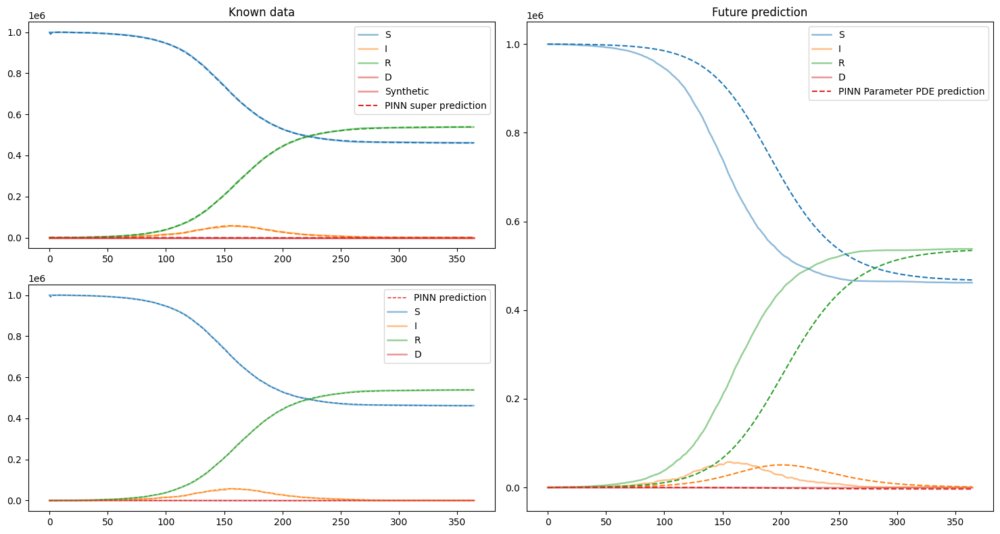

In [76]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                  Test loss                                                                                                                   Test metric
10000     [4.55e-07, 8.61e-07, 4.44e-07, 4.22e-07, 2.52e-09, 5.48e-10, 3.07e-10, 9.98e-12, 6.04e-06, 2.92e-06, 5.38e-06, 6.95e-07]    [4.55e-07, 8.61e-07, 4.44e-07, 4.22e-07, 2.52e-09, 5.48e-10, 3.07e-10, 9.98e-12, 6.04e-06, 2.92e-06, 5.38e-06, 6.95e-07]    []  
12000     [2.32e-06, 8.09e-07, 2.68e-06, 6.11e-08, 7.17e-07, 6.79e-08, 2.93e-09, 2.14e-08, 3.30e-04, 1.63e-04, 3.83e-04, 1.14e-05]    [2.32e-06, 8.09e-07, 2.68e-06, 6.11e-08, 7.17e-07, 6.79e-08, 2.93e-09, 2.14e-08, 3.30e-04, 1.63e-04, 3.83e-04, 1.14e-05]    []  

Best model at step 8578:
  train loss: 6.83e-06
  test loss: 6.83e-06
  test metric: []

'train' took 14.051867 s

Training model...

Step      Train loss                              

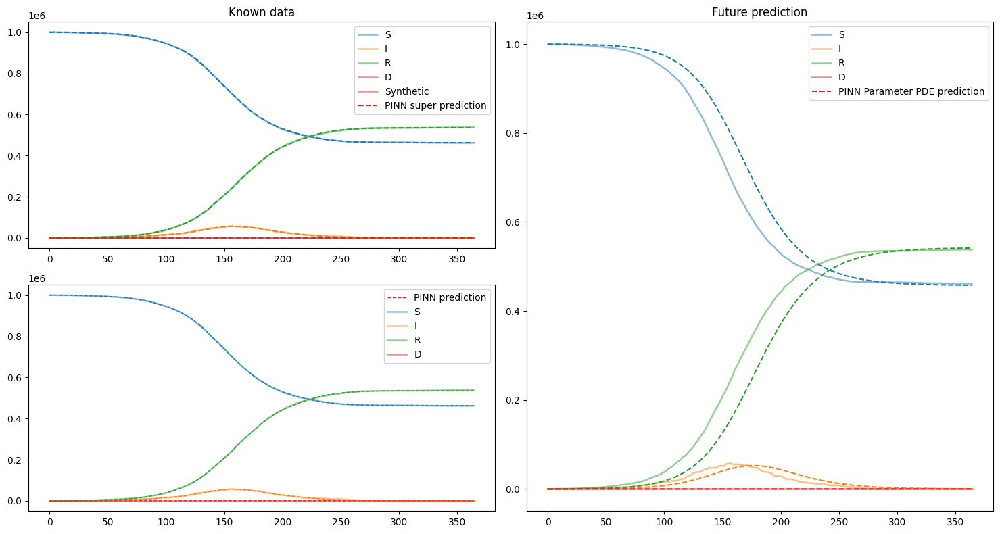

In [77]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                  Test loss                                                                                                                   Test metric
96000     [1.56e-06, 3.10e-07, 1.74e-06, 6.83e-09, 9.31e-08, 3.08e-07, 3.98e-07, 6.01e-07, 1.96e-04, 1.51e-04, 2.21e-04, 8.10e-07]    [1.56e-06, 3.10e-07, 1.74e-06, 6.83e-09, 9.31e-08, 3.08e-07, 3.98e-07, 6.01e-07, 1.96e-04, 1.51e-04, 2.21e-04, 8.10e-07]    []  
98000     [3.33e-07, 2.23e-07, 1.93e-07, 1.02e-07, 4.12e-09, 3.26e-07, 6.99e-08, 1.88e-07, 1.37e-05, 3.14e-06, 1.45e-05, 8.09e-07]    [3.33e-07, 2.23e-07, 1.93e-07, 1.02e-07, 4.12e-09, 3.26e-07, 6.99e-08, 1.88e-07, 1.37e-05, 3.14e-06, 1.45e-05, 8.09e-07]    []  

Best model at step 95695:
  train loss: 5.52e-06
  test loss: 5.52e-06
  test metric: []

'train' took 14.316307 s

Training model...

Step      Train loss                             

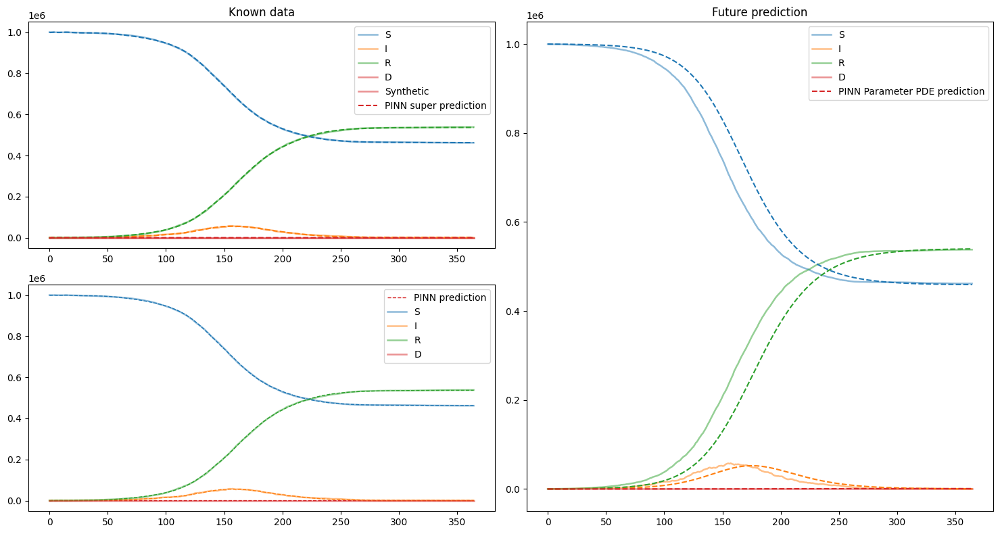

In [78]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
20000     [1.34e-05, 3.42e-06, 6.41e-06, 5.80e-06, 2.14e-06, 2.29e-06, 1.75e-06, 1.81e-08, 6.41e-07, 3.22e-07, 5.44e-05, 5.93e-04, 7.28e-04, 5.05e-06, 2.94e-06, 2.96e-08, 1.06e-07, 2.45e-09, 4.81e-09, 4.50e-10, 1.14e-07, 3.44e-07]    [1.34e-05, 3.42e-06, 6.41e-06, 5.80e-06, 2.14e-06, 2.29e-06, 1.75e-06, 1.81e-08, 6.41e-07, 3.22e-07, 5.44e-05, 5.93e-04, 7.28e-04, 5.05e-06, 2.94e-06, 2.96e-08, 1.06e-07, 2.45e-09, 4.81e-09, 4.50e-10, 1.14e-07, 3.44e-07]    []  
20100     [9.17e-06, 2.64e-06, 5.64e-06, 3.98e-0

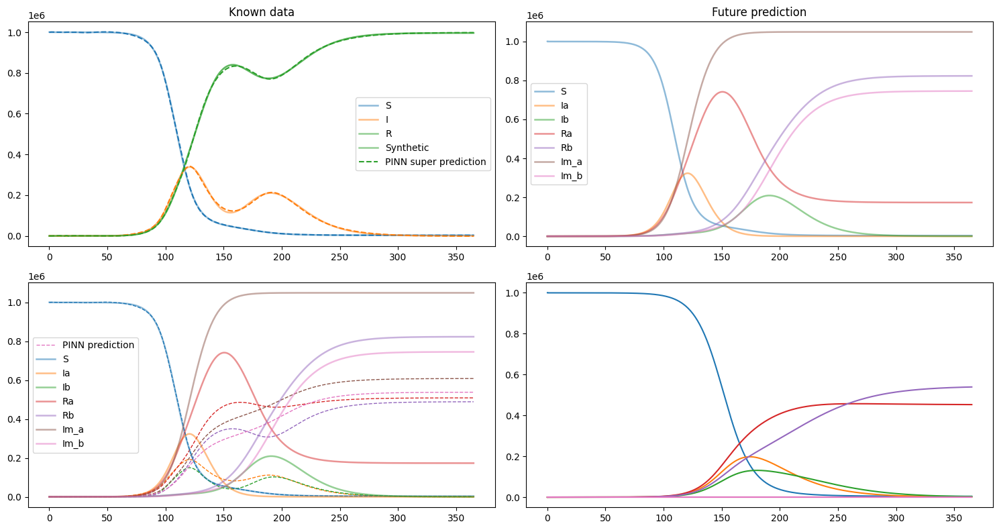

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
26000     [6.91e-06, 4.08e-06, 5.20e-06, 5.03e-06, 5.63e-06, 1.52e-06, 1.61e-06, 8.28e-05, 7.10e-05, 9.29e-07, 3.83e-06, 3.86e-05, 6.97e-05, 6.11e-05, 2.07e-06, 8.53e-07, 1.69e-06, 1.12e-06, 3.59e-06, 1.38e-06, 1.29e-05, 7.53e-05]    [6.91e-06, 4.08e-06, 5.20e-06, 5.03e-06, 5.63e-06, 1.52e-06, 1.61e-06, 8.28e-05, 7.10e-05, 9.29e-07, 3.83e-06, 3.86e-05, 6.97e-05, 6.11e-05, 2.07e-06, 8.53e-07, 1.69e-06, 1.12e-06, 3.59e-06, 1.38e-06, 1.29e-05, 7.53e-05]    []  
26100     [2.90e-06, 3.79e-06, 4.96e-06, 4.44e-0

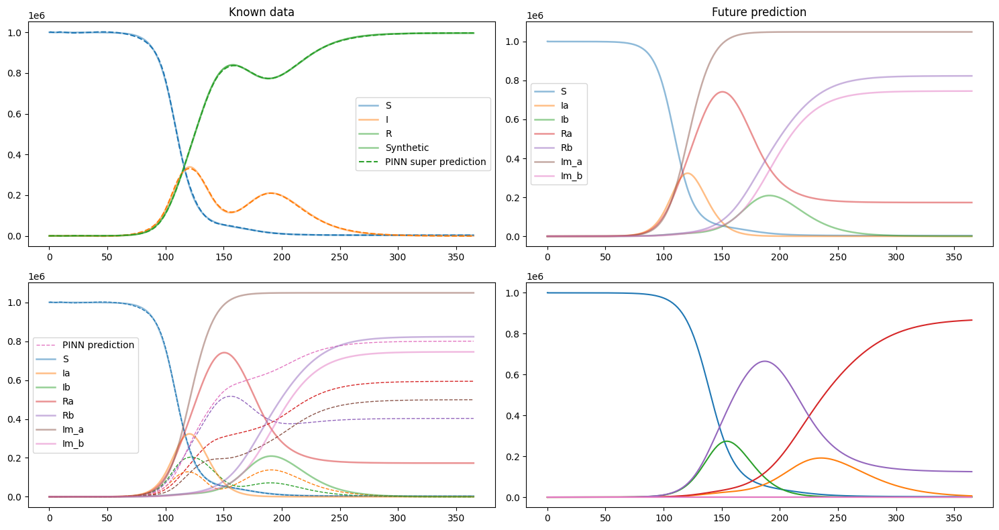

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
48000     [2.10e-06, 5.12e-06, 3.74e-06, 4.32e-06, 3.15e-06, 9.99e-07, 8.94e-07, 1.08e-07, 6.11e-06, 2.31e-08, 1.26e-06, 9.62e-07, 1.02e-06, 5.23e-07, 6.69e-08, 1.08e-08, 1.74e-08, 1.38e-08, 6.88e-10, 9.16e-07, 5.58e-08, 5.54e-06]    [2.10e-06, 5.12e-06, 3.74e-06, 4.32e-06, 3.15e-06, 9.99e-07, 8.94e-07, 1.08e-07, 6.11e-06, 2.31e-08, 1.26e-06, 9.62e-07, 1.02e-06, 5.23e-07, 6.69e-08, 1.08e-08, 1.74e-08, 1.38e-08, 6.88e-10, 9.16e-07, 5.58e-08, 5.54e-06]    []  
48100     [2.68e-06, 4.54e-06, 4.16e-06, 4.79e-0

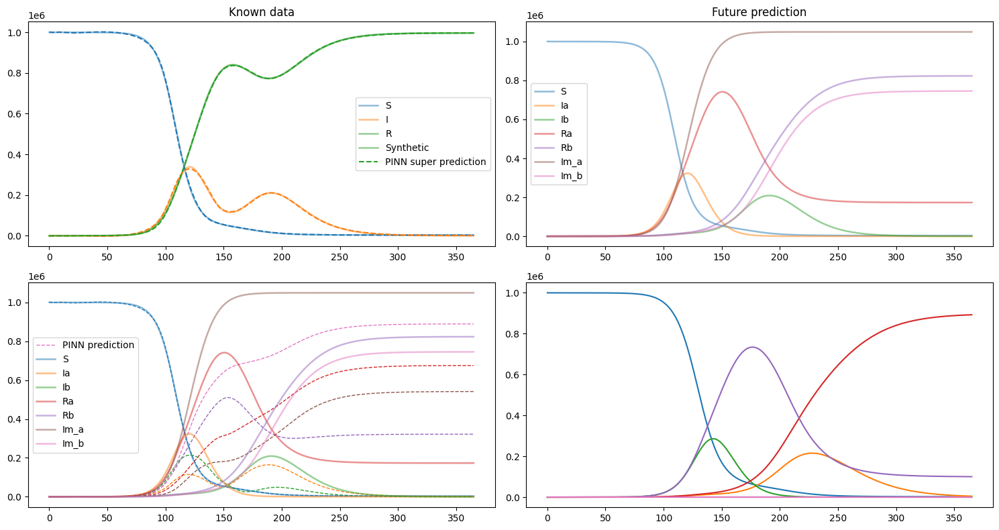

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
50000     [1.21e-05, 3.94e-06, 6.29e-06, 4.38e-06, 4.49e-06, 6.68e-07, 1.44e-06, 1.65e-08, 1.07e-08, 9.56e-12, 1.54e-05, 6.36e-04, 7.42e-04, 6.11e-07, 6.79e-08, 4.48e-09, 2.88e-08, 6.17e-08, 3.19e-08, 1.31e-08, 1.46e-07, 1.33e-07]    [1.21e-05, 3.94e-06, 6.29e-06, 4.38e-06, 4.49e-06, 6.68e-07, 1.44e-06, 1.65e-08, 1.07e-08, 9.56e-12, 1.54e-05, 6.36e-04, 7.42e-04, 6.11e-07, 6.79e-08, 4.48e-09, 2.88e-08, 6.17e-08, 3.19e-08, 1.31e-08, 1.46e-07, 1.33e-07]    []  
50100     [1.14e-05, 4.05e-06, 5.72e-06, 4.47e-0

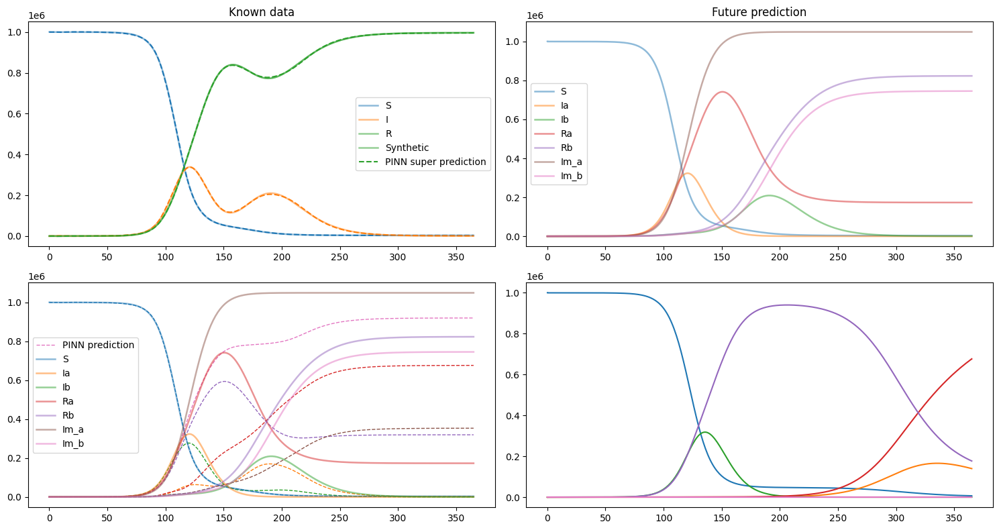

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
86000     [8.00e-07, 3.57e-06, 2.82e-06, 2.39e-06, 1.28e-06, 6.84e-07, 1.74e-06, 3.36e-14, 9.22e-10, 1.58e-11, 2.05e-07, 8.02e-07, 6.42e-07, 1.21e-08, 3.92e-09, 1.08e-09, 6.34e-09, 4.07e-09, 2.34e-09, 2.41e-09, 6.59e-09, 1.49e-08]    [8.00e-07, 3.57e-06, 2.82e-06, 2.39e-06, 1.28e-06, 6.84e-07, 1.74e-06, 3.36e-14, 9.22e-10, 1.58e-11, 2.05e-07, 8.02e-07, 6.42e-07, 1.21e-08, 3.92e-09, 1.08e-09, 6.34e-09, 4.07e-09, 2.34e-09, 2.41e-09, 6.59e-09, 1.49e-08]    []  
86100     [1.78e-06, 3.19e-06, 2.45e-06, 2.27e-0

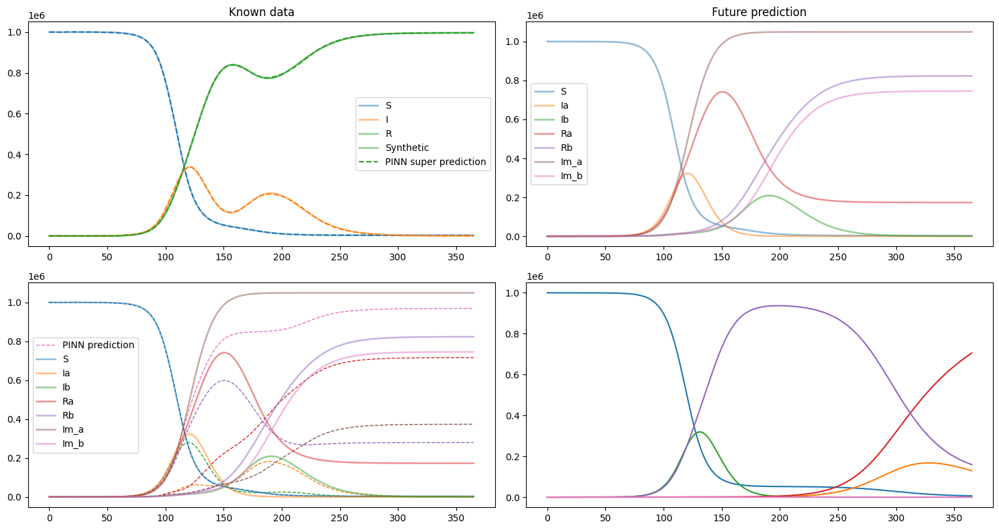

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
88000     [5.17e-06, 4.53e-06, 5.79e-06, 7.68e-06, 4.37e-06, 9.87e-07, 8.45e-06, 1.30e-06, 2.33e-06, 4.13e-07, 1.15e-04, 1.38e-04, 8.30e-05, 2.21e-05, 0.00e+00, 0.00e+00, 0.00e+00, 4.73e-08, 3.63e-08, 1.89e-07, 2.15e-07, 1.20e-06]    [5.17e-06, 4.53e-06, 5.79e-06, 7.68e-06, 4.37e-06, 9.87e-07, 8.45e-06, 1.30e-06, 2.33e-06, 4.13e-07, 1.15e-04, 1.38e-04, 8.30e-05, 2.21e-05, 0.00e+00, 0.00e+00, 0.00e+00, 4.73e-08, 3.63e-08, 1.89e-07, 2.15e-07, 1.20e-06]    []  
88100     [2.92e-06, 4.34e-06, 5.45e-06, 5.63e-0

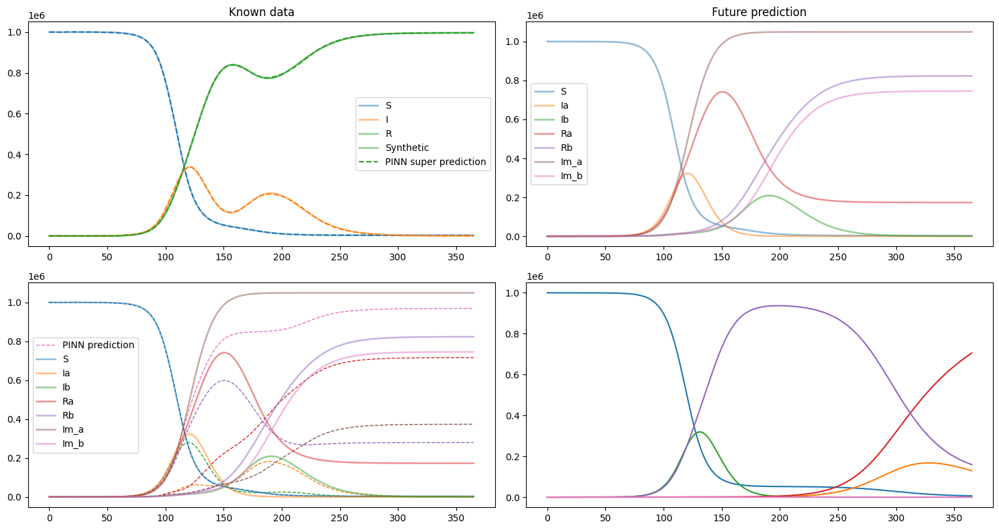

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
188000    [2.49e-05, 1.25e-05, 3.12e-06, 6.73e-06, 4.50e-06, 4.67e-06, 6.45e-07, 5.83e-07, 6.26e-07, 5.87e-05, 5.41e-05, 3.57e-04, 1.49e-04, 1.44e-03, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 8.79e-08, 0.00e+00, 6.12e-07, 7.00e-07]    [2.49e-05, 1.25e-05, 3.12e-06, 6.73e-06, 4.50e-06, 4.67e-06, 6.45e-07, 5.83e-07, 6.26e-07, 5.87e-05, 5.41e-05, 3.57e-04, 1.49e-04, 1.44e-03, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 8.79e-08, 0.00e+00, 6.12e-07, 7.00e-07]    []  
188100    [1.88e-06, 6.57e-06, 2.22e-06, 3.13e-0

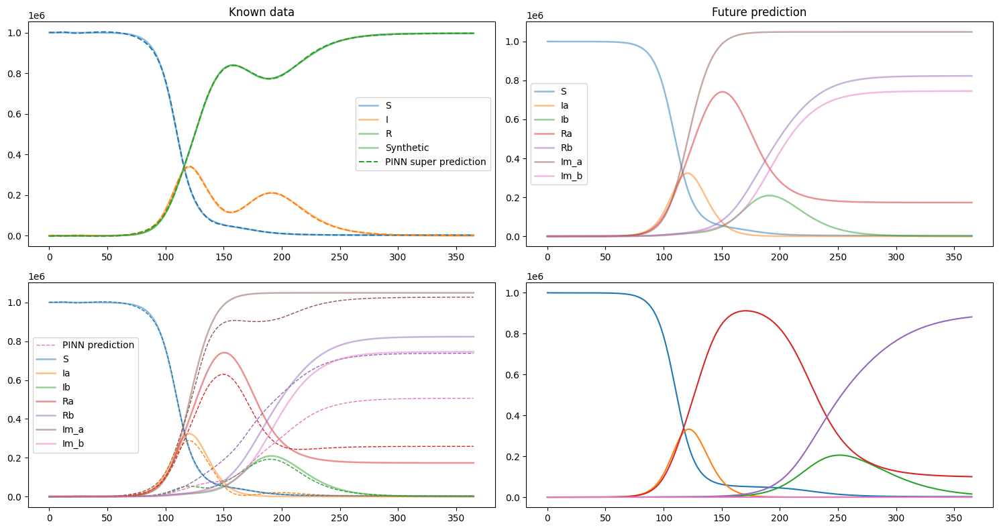

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
196000    [7.84e-07, 1.76e-06, 1.57e-06, 1.33e-06, 5.81e-07, 1.29e-06, 3.50e-07, 5.14e-06, 1.14e-09, 2.64e-08, 8.99e-06, 5.97e-06, 1.63e-05, 3.68e-06, 0.00e+00, 0.00e+00, 4.38e-10, 3.44e-09, 0.00e+00, 2.62e-11, 6.19e-06, 1.31e-08]    [7.84e-07, 1.76e-06, 1.57e-06, 1.33e-06, 5.81e-07, 1.29e-06, 3.50e-07, 5.14e-06, 1.14e-09, 2.64e-08, 8.99e-06, 5.97e-06, 1.63e-05, 3.68e-06, 0.00e+00, 0.00e+00, 4.38e-10, 3.44e-09, 0.00e+00, 2.62e-11, 6.19e-06, 1.31e-08]    []  
196100    [5.96e-07, 1.81e-06, 1.43e-06, 1.25e-0

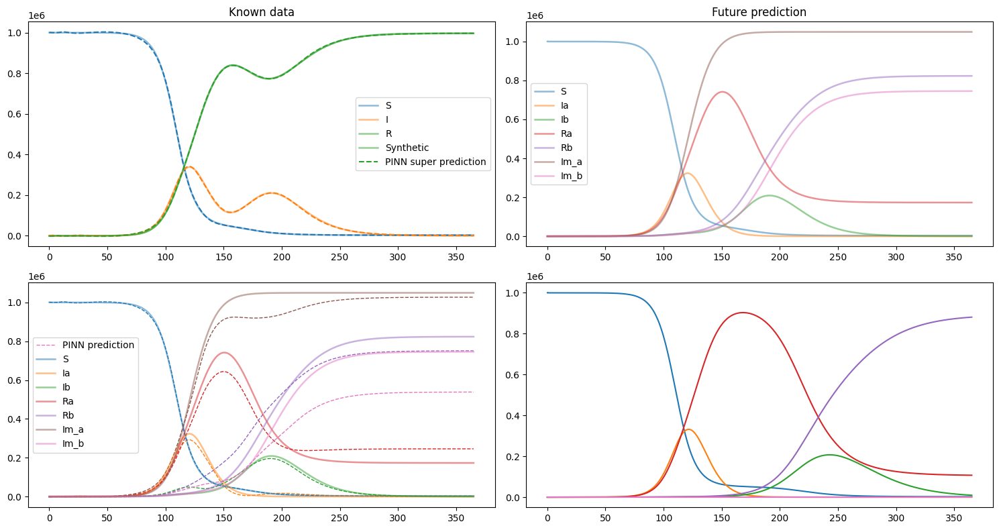

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
198000    [5.79e-06, 1.86e-06, 1.75e-06, 1.68e-06, 1.31e-06, 1.79e-06, 3.63e-07, 1.16e-04, 1.98e-04, 1.19e-06, 9.49e-05, 7.27e-05, 3.04e-04, 3.20e-04, 3.82e-06, 2.44e-06, 4.36e-06, 3.22e-06, 2.17e-05, 0.00e+00, 1.19e-04, 2.01e-04]    [5.79e-06, 1.86e-06, 1.75e-06, 1.68e-06, 1.31e-06, 1.79e-06, 3.63e-07, 1.16e-04, 1.98e-04, 1.19e-06, 9.49e-05, 7.27e-05, 3.04e-04, 3.20e-04, 3.82e-06, 2.44e-06, 4.36e-06, 3.22e-06, 2.17e-05, 0.00e+00, 1.19e-04, 2.01e-04]    []  
198100    [9.42e-06, 3.30e-06, 2.47e-06, 4.22e-0

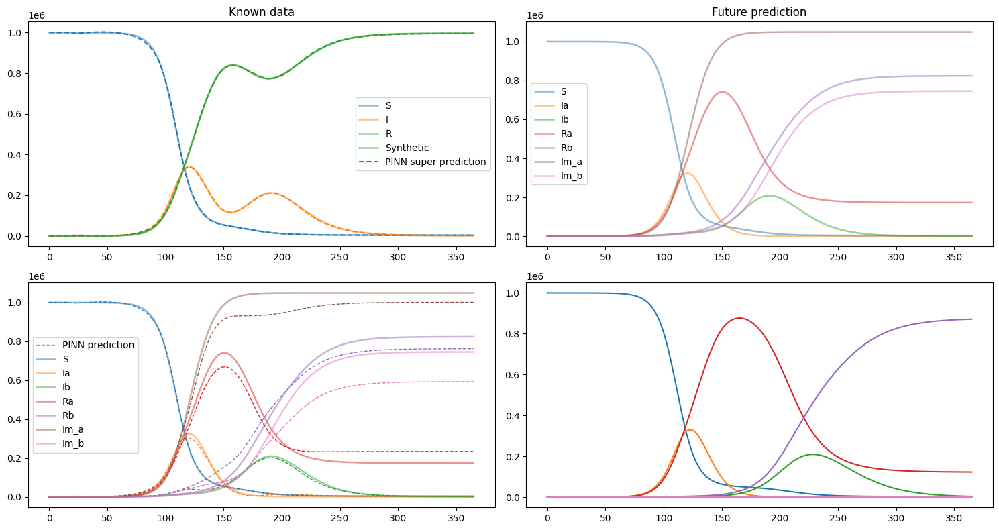

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
202000    [6.12e-07, 8.00e-07, 9.55e-07, 7.32e-07, 4.12e-07, 8.54e-07, 3.33e-07, 1.26e-05, 3.17e-06, 8.63e-07, 4.42e-06, 4.40e-06, 2.49e-06, 5.63e-06, 2.35e-08, 8.27e-08, 1.33e-07, 2.97e-08, 0.00e+00, 0.00e+00, 1.40e-05, 3.47e-06]    [6.12e-07, 8.00e-07, 9.55e-07, 7.32e-07, 4.12e-07, 8.54e-07, 3.33e-07, 1.26e-05, 3.17e-06, 8.63e-07, 4.42e-06, 4.40e-06, 2.49e-06, 5.63e-06, 2.35e-08, 8.27e-08, 1.33e-07, 2.97e-08, 0.00e+00, 0.00e+00, 1.40e-05, 3.47e-06]    []  
202100    [4.86e-07, 7.03e-07, 9.23e-07, 7.01e-0

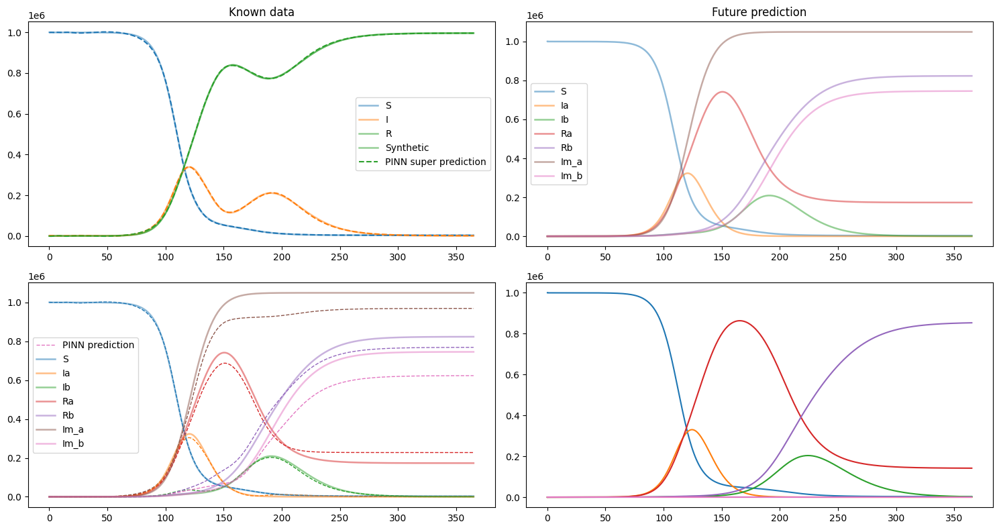

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
206000    [8.00e-06, 1.82e-06, 1.35e-06, 1.48e-06, 1.08e-06, 1.39e-06, 7.11e-07, 3.07e-05, 2.57e-06, 9.24e-06, 4.69e-05, 7.15e-05, 2.12e-04, 4.56e-04, 5.90e-06, 4.29e-06, 4.71e-06, 2.77e-06, 5.26e-06, 0.00e+00, 3.20e-05, 4.15e-06]    [8.00e-06, 1.82e-06, 1.35e-06, 1.48e-06, 1.08e-06, 1.39e-06, 7.11e-07, 3.07e-05, 2.57e-06, 9.24e-06, 4.69e-05, 7.15e-05, 2.12e-04, 4.56e-04, 5.90e-06, 4.29e-06, 4.71e-06, 2.77e-06, 5.26e-06, 0.00e+00, 3.20e-05, 4.15e-06]    []  
206100    [1.98e-06, 1.76e-06, 8.00e-07, 1.13e-0

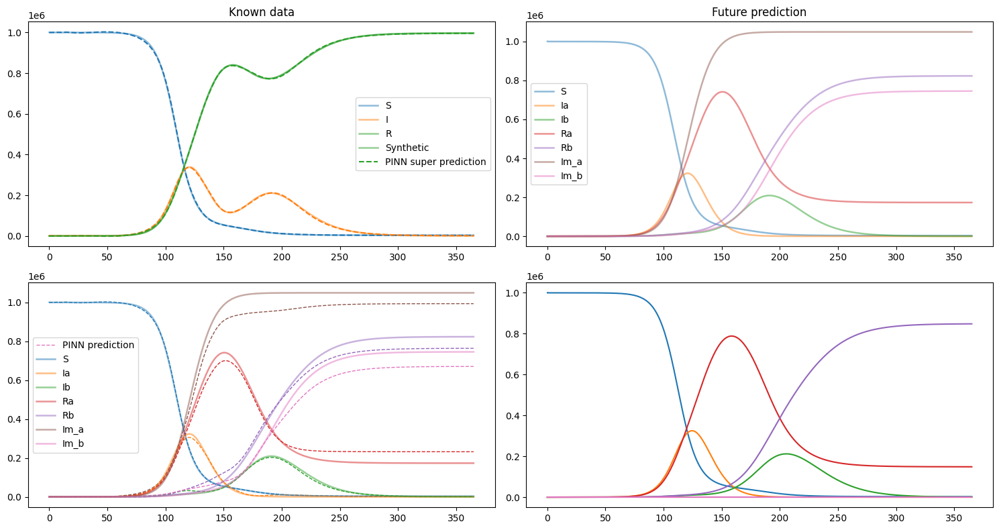

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
208000    [5.13e-07, 5.05e-07, 7.92e-07, 5.20e-07, 3.33e-07, 7.07e-07, 3.55e-07, 1.54e-05, 1.51e-04, 9.83e-07, 1.09e-05, 8.19e-06, 1.14e-05, 6.81e-07, 1.07e-07, 5.69e-08, 3.31e-09, 5.30e-08, 0.00e+00, 3.14e-05, 1.86e-05, 1.39e-04]    [5.13e-07, 5.05e-07, 7.92e-07, 5.20e-07, 3.33e-07, 7.07e-07, 3.55e-07, 1.54e-05, 1.51e-04, 9.83e-07, 1.09e-05, 8.19e-06, 1.14e-05, 6.81e-07, 1.07e-07, 5.69e-08, 3.31e-09, 5.30e-08, 0.00e+00, 3.14e-05, 1.86e-05, 1.39e-04]    []  
208100    [1.09e-05, 3.33e-06, 1.51e-06, 1.87e-0

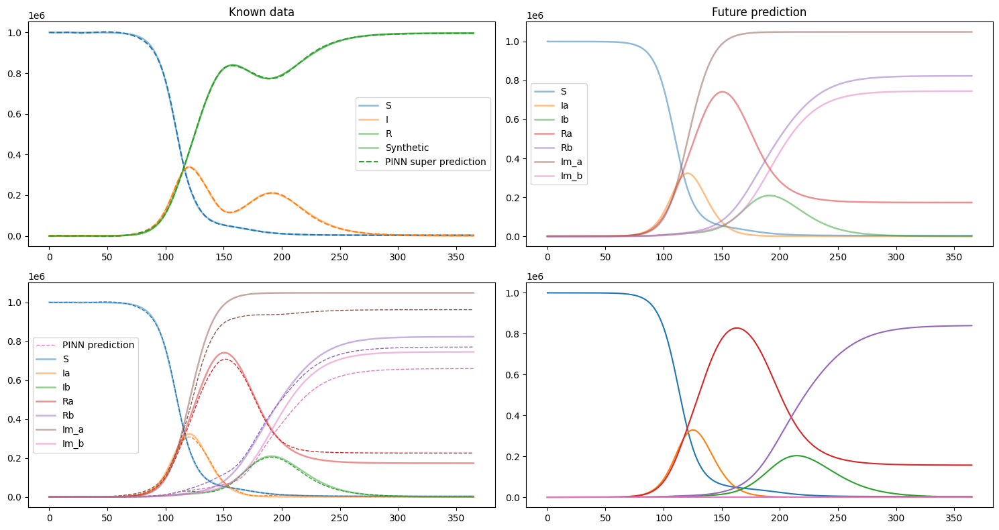

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
210000    [3.53e-06, 5.64e-06, 1.63e-06, 8.51e-06, 2.48e-06, 3.74e-06, 1.50e-06, 3.12e-05, 1.51e-05, 3.50e-06, 2.42e-05, 1.83e-04, 7.88e-05, 6.80e-04, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 2.92e-05, 1.72e-05]    [3.53e-06, 5.64e-06, 1.63e-06, 8.51e-06, 2.48e-06, 3.74e-06, 1.50e-06, 3.12e-05, 1.51e-05, 3.50e-06, 2.42e-05, 1.83e-04, 7.88e-05, 6.80e-04, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 2.92e-05, 1.72e-05]    []  
210100    [4.13e-07, 6.86e-07, 6.22e-07, 5.02e-0

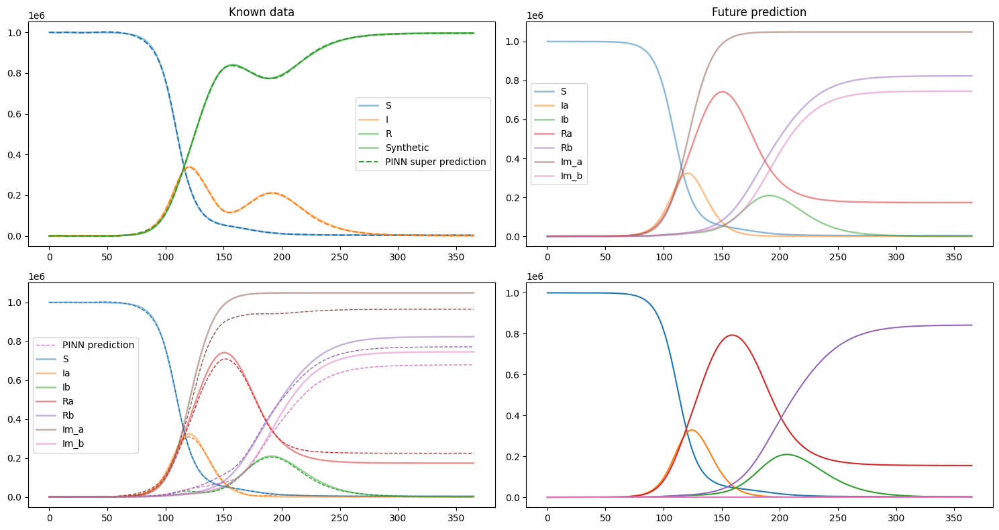

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
212000    [7.92e-06, 2.16e-06, 1.80e-06, 2.64e-06, 1.12e-06, 1.26e-06, 6.18e-07, 2.46e-05, 4.32e-07, 1.11e-05, 6.57e-05, 7.12e-05, 2.67e-04, 3.57e-04, 2.64e-06, 4.50e-06, 2.40e-06, 8.38e-06, 2.86e-06, 2.50e-08, 1.90e-05, 3.42e-07]    [7.92e-06, 2.16e-06, 1.80e-06, 2.64e-06, 1.12e-06, 1.26e-06, 6.18e-07, 2.46e-05, 4.32e-07, 1.11e-05, 6.57e-05, 7.12e-05, 2.67e-04, 3.57e-04, 2.64e-06, 4.50e-06, 2.40e-06, 8.38e-06, 2.86e-06, 2.50e-08, 1.90e-05, 3.42e-07]    []  
212100    [6.11e-05, 2.11e-05, 5.21e-06, 1.43e-0

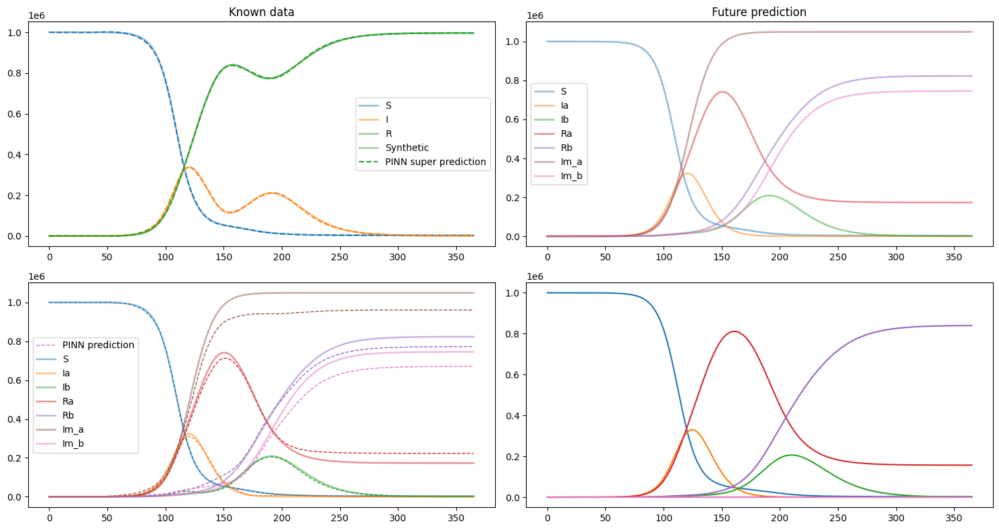

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
214000    [1.96e-06, 1.39e-06, 8.27e-07, 8.68e-07, 7.13e-07, 8.73e-07, 5.90e-07, 3.87e-05, 5.34e-10, 9.53e-07, 2.58e-05, 1.61e-05, 5.95e-05, 7.01e-05, 1.44e-06, 4.02e-07, 5.95e-07, 4.09e-07, 0.00e+00, 1.68e-09, 3.65e-05, 5.46e-09]    [1.96e-06, 1.39e-06, 8.27e-07, 8.68e-07, 7.13e-07, 8.73e-07, 5.90e-07, 3.87e-05, 5.34e-10, 9.53e-07, 2.58e-05, 1.61e-05, 5.95e-05, 7.01e-05, 1.44e-06, 4.02e-07, 5.95e-07, 4.09e-07, 0.00e+00, 1.68e-09, 3.65e-05, 5.46e-09]    []  
214100    [6.52e-06, 2.46e-06, 7.35e-07, 1.42e-0

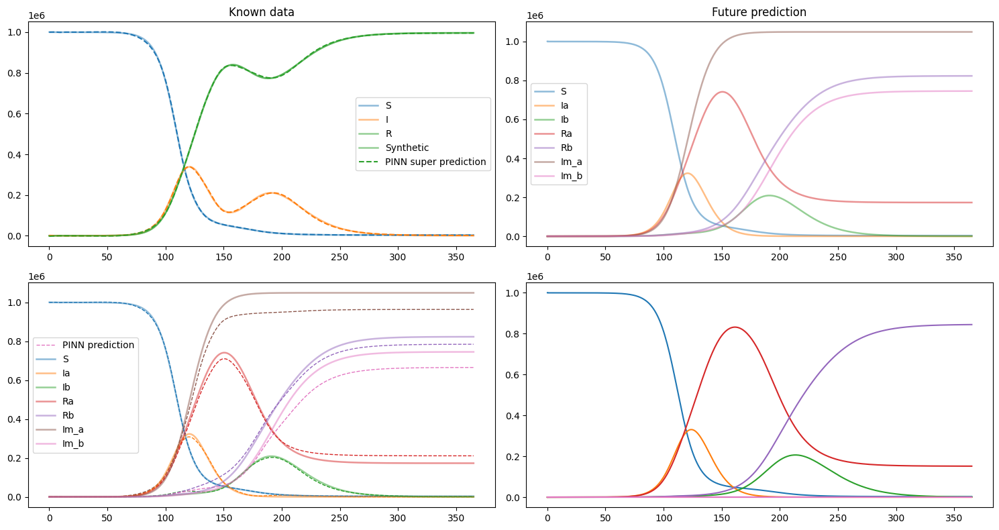

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
224000    [3.61e-07, 7.10e-07, 4.40e-07, 4.15e-07, 3.71e-07, 6.90e-07, 3.41e-07, 1.38e-05, 4.55e-06, 7.08e-07, 2.01e-05, 1.34e-05, 2.21e-05, 8.92e-07, 5.17e-08, 3.23e-09, 2.04e-07, 1.27e-07, 2.19e-06, 0.00e+00, 1.34e-05, 4.50e-06]    [3.61e-07, 7.10e-07, 4.40e-07, 4.15e-07, 3.71e-07, 6.90e-07, 3.41e-07, 1.38e-05, 4.55e-06, 7.08e-07, 2.01e-05, 1.34e-05, 2.21e-05, 8.92e-07, 5.17e-08, 3.23e-09, 2.04e-07, 1.27e-07, 2.19e-06, 0.00e+00, 1.34e-05, 4.50e-06]    []  
224100    [5.80e-07, 5.28e-07, 5.75e-07, 4.40e-0

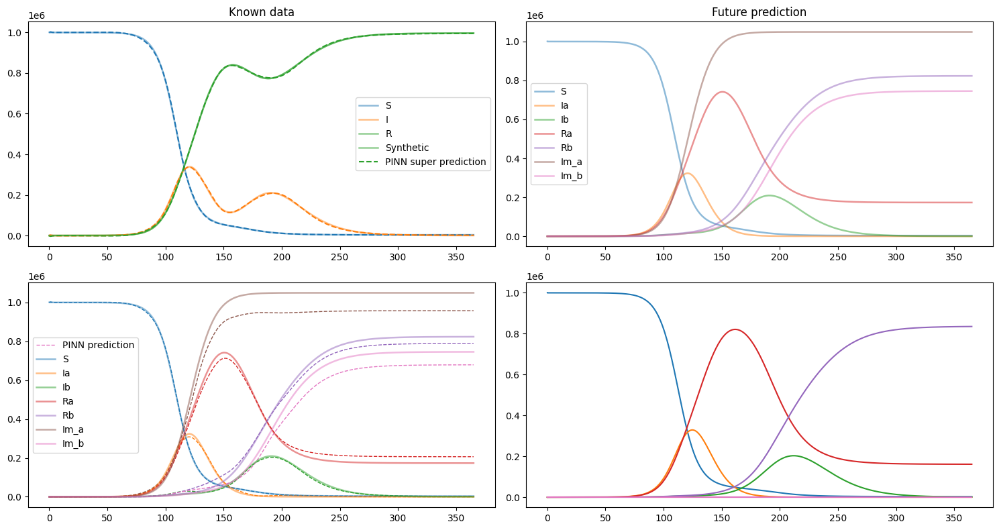

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
250000    [1.21e-05, 5.18e-06, 2.86e-06, 2.85e-06, 1.55e-06, 3.81e-06, 1.22e-06, 1.30e-05, 8.69e-05, 3.12e-05, 3.79e-05, 1.16e-04, 7.02e-05, 5.95e-04, 2.46e-05, 6.29e-06, 1.83e-06, 1.47e-06, 1.90e-06, 0.00e+00, 1.17e-05, 1.74e-05]    [1.21e-05, 5.18e-06, 2.86e-06, 2.85e-06, 1.55e-06, 3.81e-06, 1.22e-06, 1.30e-05, 8.69e-05, 3.12e-05, 3.79e-05, 1.16e-04, 7.02e-05, 5.95e-04, 2.46e-05, 6.29e-06, 1.83e-06, 1.47e-06, 1.90e-06, 0.00e+00, 1.17e-05, 1.74e-05]    []  
250100    [1.14e-05, 3.21e-06, 1.28e-06, 2.22e-0

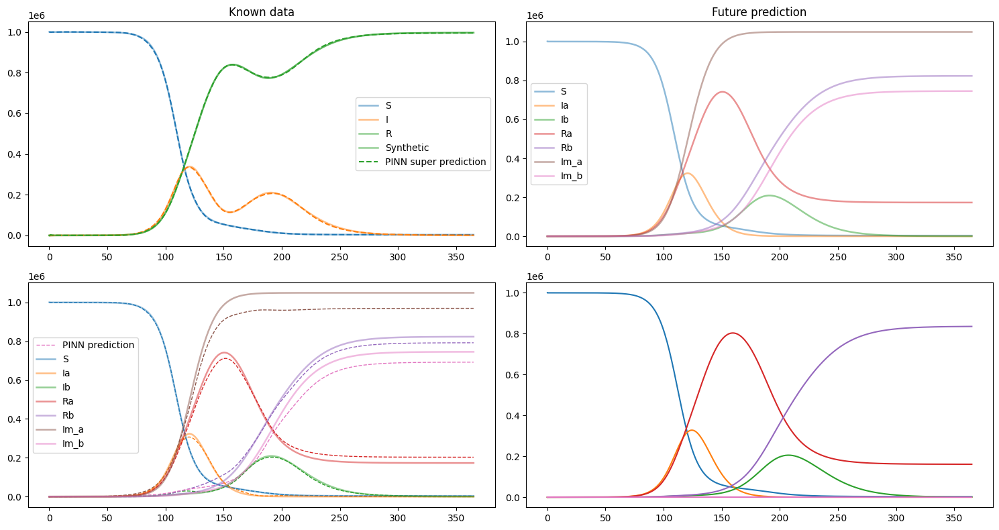

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
260000    [2.69e-06, 1.55e-06, 1.15e-06, 1.35e-06, 9.60e-07, 1.06e-06, 7.15e-07, 3.66e-05, 1.28e-06, 4.61e-09, 9.92e-05, 6.45e-05, 1.55e-04, 4.44e-05, 3.04e-07, 1.04e-06, 1.23e-06, 3.29e-07, 0.00e+00, 9.74e-08, 2.84e-05, 6.45e-07]    [2.69e-06, 1.55e-06, 1.15e-06, 1.35e-06, 9.60e-07, 1.06e-06, 7.15e-07, 3.66e-05, 1.28e-06, 4.61e-09, 9.92e-05, 6.45e-05, 1.55e-04, 4.44e-05, 3.04e-07, 1.04e-06, 1.23e-06, 3.29e-07, 0.00e+00, 9.74e-08, 2.84e-05, 6.45e-07]    []  
260100    [1.01e-06, 4.73e-07, 5.23e-07, 4.60e-0

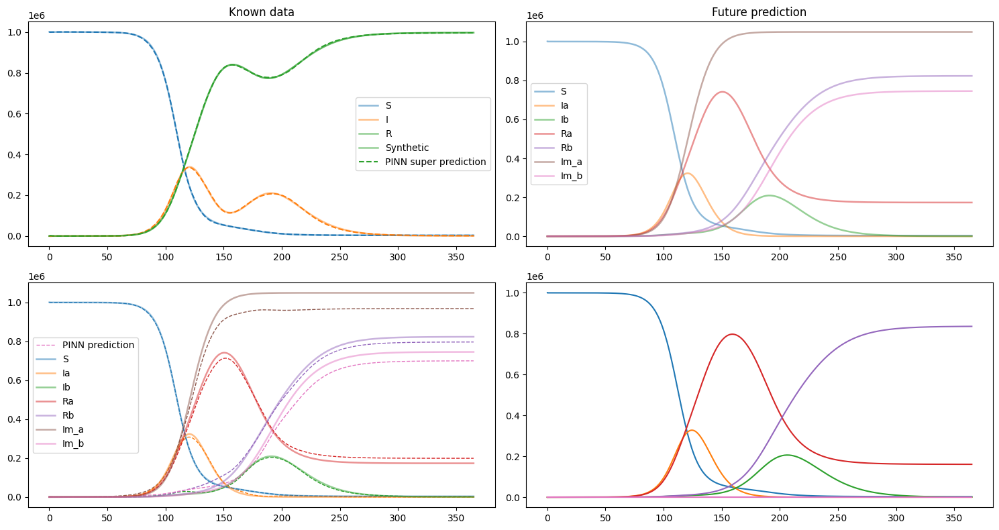

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
262000    [3.86e-06, 2.92e-06, 3.46e-06, 2.13e-06, 4.19e-06, 9.64e-07, 2.04e-06, 1.24e-06, 2.59e-05, 6.42e-07, 2.16e-05, 2.11e-05, 1.73e-04, 2.82e-04, 2.10e-06, 7.73e-07, 2.84e-06, 2.43e-06, 1.22e-08, 0.00e+00, 3.48e-06, 3.56e-05]    [3.86e-06, 2.92e-06, 3.46e-06, 2.13e-06, 4.19e-06, 9.64e-07, 2.04e-06, 1.24e-06, 2.59e-05, 6.42e-07, 2.16e-05, 2.11e-05, 1.73e-04, 2.82e-04, 2.10e-06, 7.73e-07, 2.84e-06, 2.43e-06, 1.22e-08, 0.00e+00, 3.48e-06, 3.56e-05]    []  
262100    [9.49e-07, 1.92e-06, 2.14e-06, 2.33e-0

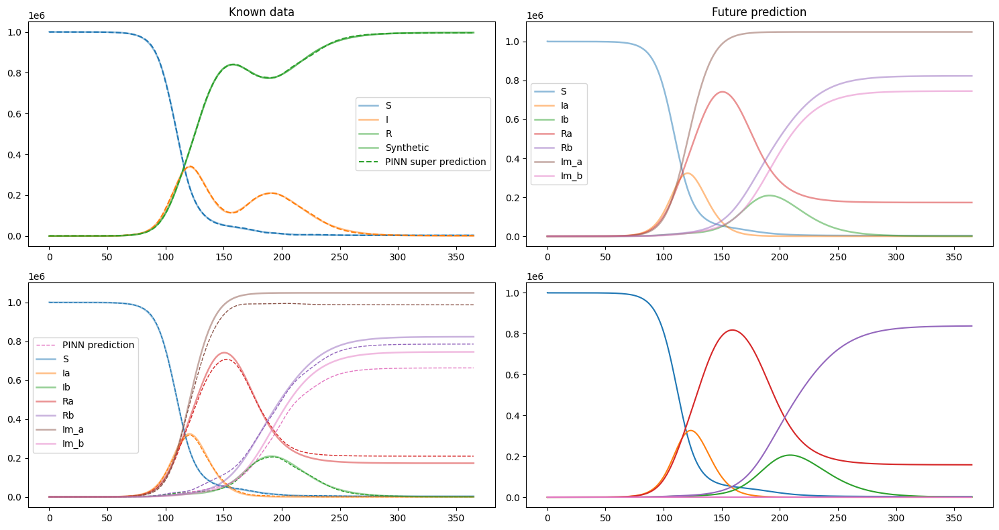

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
302000    [1.99e-07, 6.09e-07, 6.12e-07, 5.26e-07, 4.21e-07, 5.98e-07, 1.94e-07, 2.42e-08, 8.57e-10, 5.34e-10, 3.66e-07, 9.76e-07, 1.09e-06, 7.48e-08, 1.61e-08, 2.93e-10, 7.45e-09, 1.45e-08, 0.00e+00, 9.87e-12, 2.49e-08, 7.70e-11]    [1.99e-07, 6.09e-07, 6.12e-07, 5.26e-07, 4.21e-07, 5.98e-07, 1.94e-07, 2.42e-08, 8.57e-10, 5.34e-10, 3.66e-07, 9.76e-07, 1.09e-06, 7.48e-08, 1.61e-08, 2.93e-10, 7.45e-09, 1.45e-08, 0.00e+00, 9.87e-12, 2.49e-08, 7.70e-11]    []  
302100    [1.69e-07, 4.25e-07, 4.85e-07, 3.22e-0

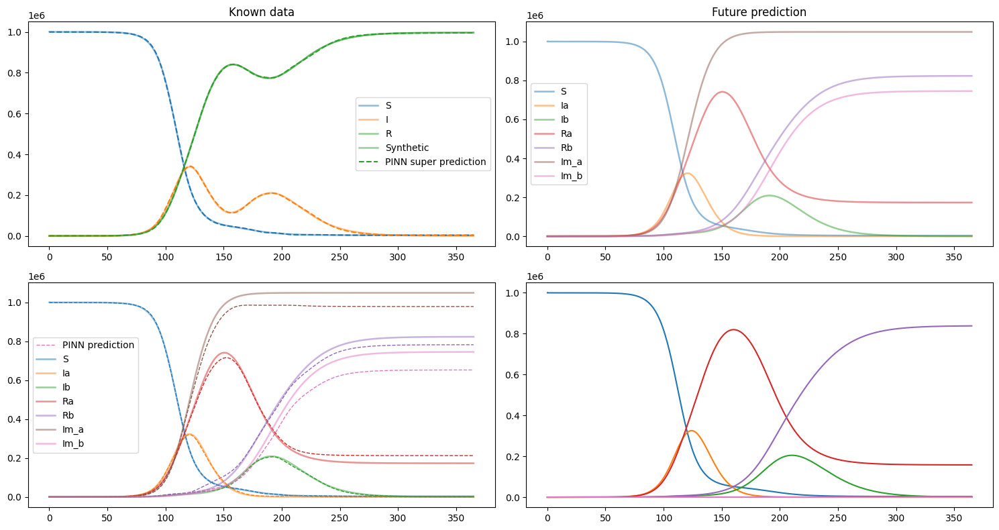

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
304000    [2.00e-07, 4.86e-07, 4.84e-07, 2.96e-07, 4.87e-07, 5.22e-07, 2.01e-07, 1.22e-09, 4.44e-17, 4.99e-11, 4.18e-07, 8.96e-07, 8.28e-07, 4.00e-09, 2.12e-09, 2.27e-13, 2.14e-11, 2.64e-09, 2.15e-10, 1.74e-15, 1.72e-09, 3.76e-11]    [2.00e-07, 4.86e-07, 4.84e-07, 2.96e-07, 4.87e-07, 5.22e-07, 2.01e-07, 1.22e-09, 4.44e-17, 4.99e-11, 4.18e-07, 8.96e-07, 8.28e-07, 4.00e-09, 2.12e-09, 2.27e-13, 2.14e-11, 2.64e-09, 2.15e-10, 1.74e-15, 1.72e-09, 3.76e-11]    []  
304100    [1.77e-07, 4.11e-07, 4.10e-07, 2.70e-0

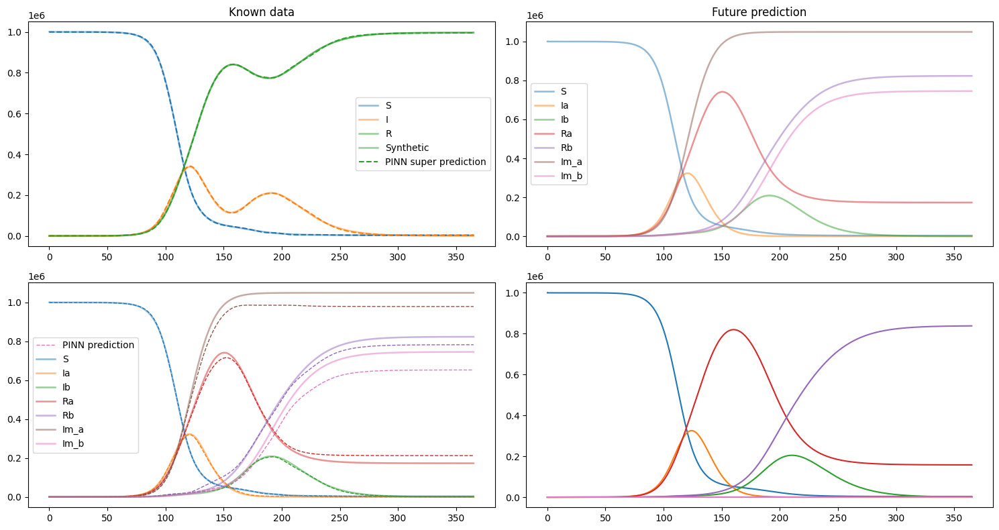

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
404000    [7.71e-07, 1.10e-06, 8.15e-07, 1.47e-06, 1.03e-06, 8.01e-07, 7.33e-07, 9.45e-10, 6.51e-09, 1.22e-09, 1.19e-06, 1.63e-06, 1.35e-06, 1.10e-07, 2.00e-08, 1.42e-09, 5.79e-09, 5.47e-09, 3.58e-09, 3.57e-10, 2.67e-08, 2.27e-09]    [7.71e-07, 1.10e-06, 8.15e-07, 1.47e-06, 1.03e-06, 8.01e-07, 7.33e-07, 9.45e-10, 6.51e-09, 1.22e-09, 1.19e-06, 1.63e-06, 1.35e-06, 1.10e-07, 2.00e-08, 1.42e-09, 5.79e-09, 5.47e-09, 3.58e-09, 3.57e-10, 2.67e-08, 2.27e-09]    []  
404100    [5.28e-07, 8.92e-07, 8.69e-07, 1.62e-0

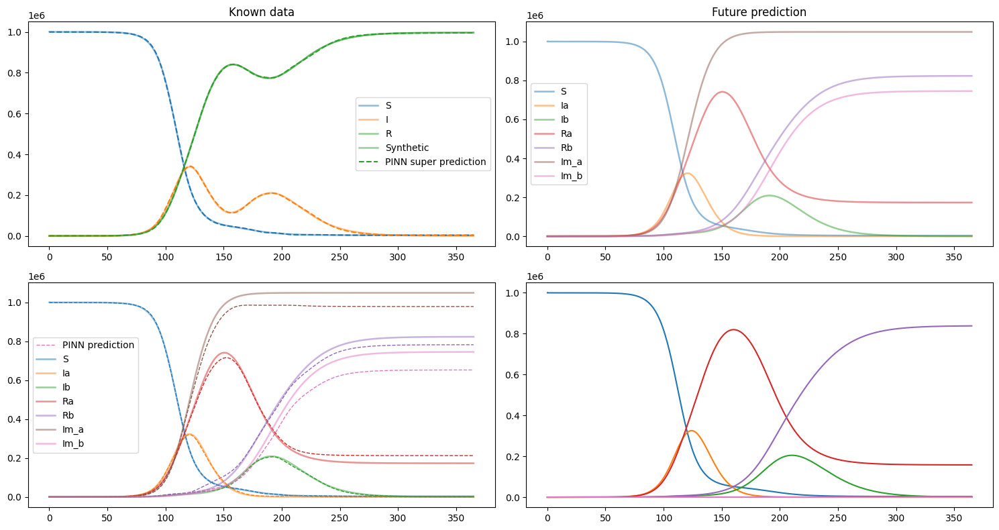

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
504000    [2.87e-07, 5.89e-07, 5.40e-07, 3.71e-07, 3.25e-07, 4.21e-07, 1.61e-07, 2.00e-08, 4.14e-10, 3.38e-12, 4.67e-07, 1.11e-06, 8.97e-07, 1.51e-09, 5.09e-09, 2.31e-10, 5.38e-10, 1.41e-10, 1.49e-08, 0.00e+00, 9.19e-08, 8.51e-10]    [2.87e-07, 5.89e-07, 5.40e-07, 3.71e-07, 3.25e-07, 4.21e-07, 1.61e-07, 2.00e-08, 4.14e-10, 3.38e-12, 4.67e-07, 1.11e-06, 8.97e-07, 1.51e-09, 5.09e-09, 2.31e-10, 5.38e-10, 1.41e-10, 1.49e-08, 0.00e+00, 9.19e-08, 8.51e-10]    []  
504100    [3.58e-07, 6.91e-07, 7.15e-07, 4.46e-0

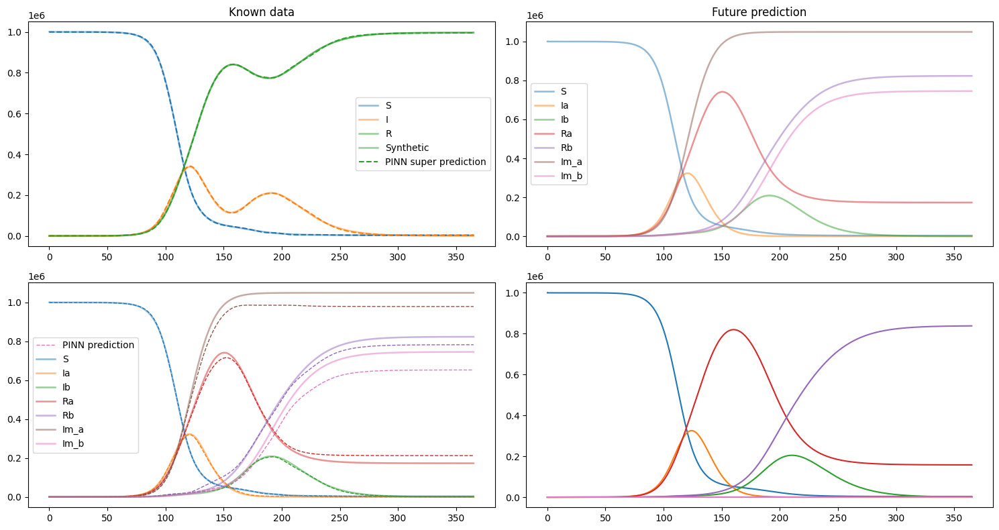

In [ ]:
model.intermediate_train()

Training model...

Step      Train loss                                                                                                                                                                                                                      Test loss                                                                                                                                                                                                                       Test metric
604000    [3.50e-05, 1.02e-05, 6.15e-06, 5.99e-06, 4.61e-06, 5.10e-06, 1.72e-06, 3.48e-05, 8.22e-10, 5.61e-05, 7.81e-05, 3.73e-04, 6.13e-04, 2.21e-03, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 4.48e-12, 4.42e-05, 8.61e-09]    [3.50e-05, 1.02e-05, 6.15e-06, 5.99e-06, 4.61e-06, 5.10e-06, 1.72e-06, 3.48e-05, 8.22e-10, 5.61e-05, 7.81e-05, 3.73e-04, 6.13e-04, 2.21e-03, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 0.00e+00, 4.48e-12, 4.42e-05, 8.61e-09]    []  
604100    [2.43e-07, 1.75e-06, 1.94e-06, 1.27e-0

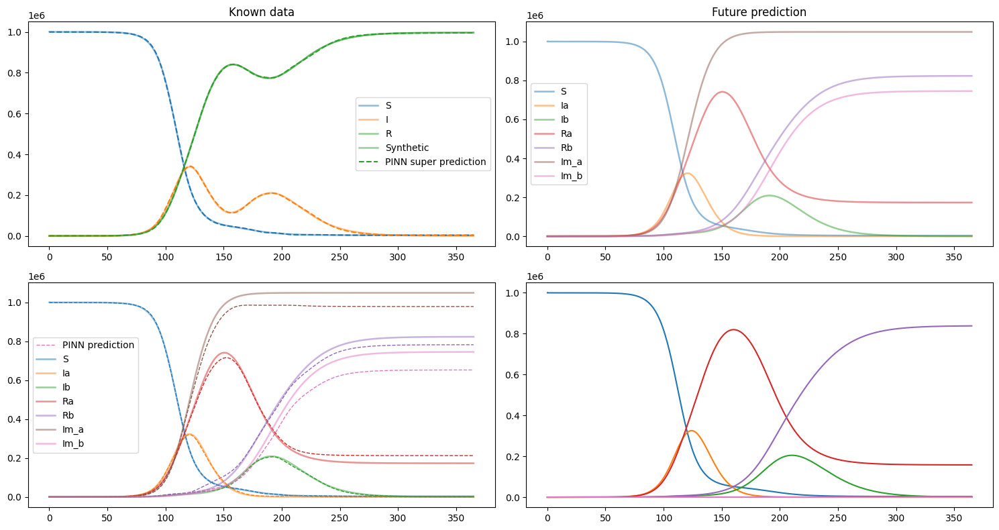

In [ ]:
model.intermediate_train()

# Final Output 

In [ ]:
# params_nn, best_step = model.get_best_params(out_func=np.exp) # parameters need to be extracted with the exponential functino as they have been modelled in logspace
params_nn, best_step = model.get_best_params() # parameters need to be extracted with the exponential functino as they have been modelled in logspace
print(static_parameters, sep="\n")
t_nn_param, wsol_nn_param, wsol_sird_nn_param = solver(*params_nn)

model.set_synthetic_data(t_synth, solution_synth_full) 
model.set_nn_synthetic_data(t_nn_param, wsol_nn_param, wsol_sird_nn_param)
plot = Plot(model, values_to_plot=sird_model.initial_conditions_keys) # class that contains plotting functions
# plot.show_known_and_prediction()
# plot.plot_param_history()
# plot.plot_loss_history()

Best train step: 302150
lambda_a: 2.166892767
lambda_b: 1.8063528538
kappa_a: 0.76282000542
kappa_b: 0.44990721345
{'lambda_a': 2.2, 'lambda_b': 1.9, 'kappa_a': 0.8, 'kappa_b': 0.5}


Error in callback <function _draw_all_if_interactive at 0x1614ed430> (for post_execute):


OverflowError: Exceeded cell block limit in Agg.  Please set the value of rcParams['agg.path.chunksize'], (currently 0) to be greater than 100 or increase the path simplification threshold(rcParams['path.simplify_threshold'] = 0.111111111111 by default and path.simplify_threshold = 0.111111111111 on the input).

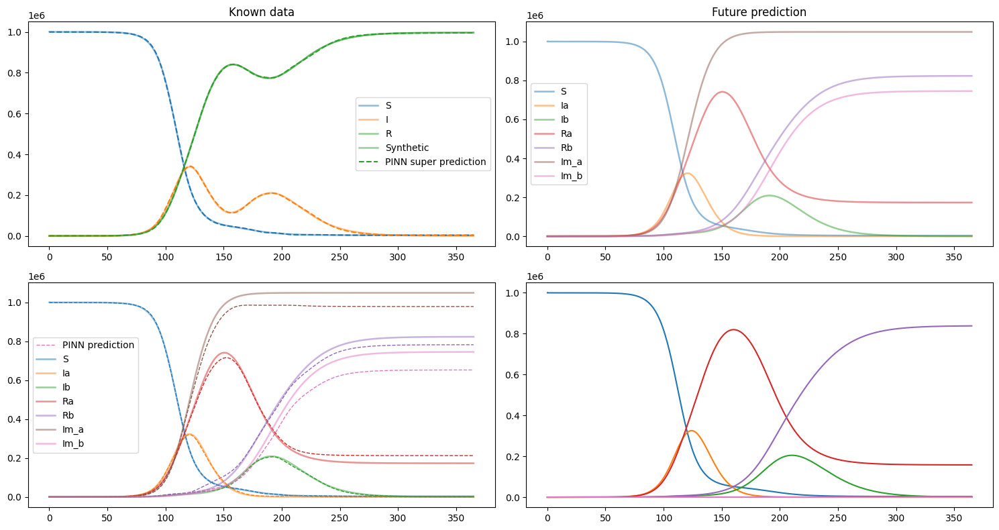

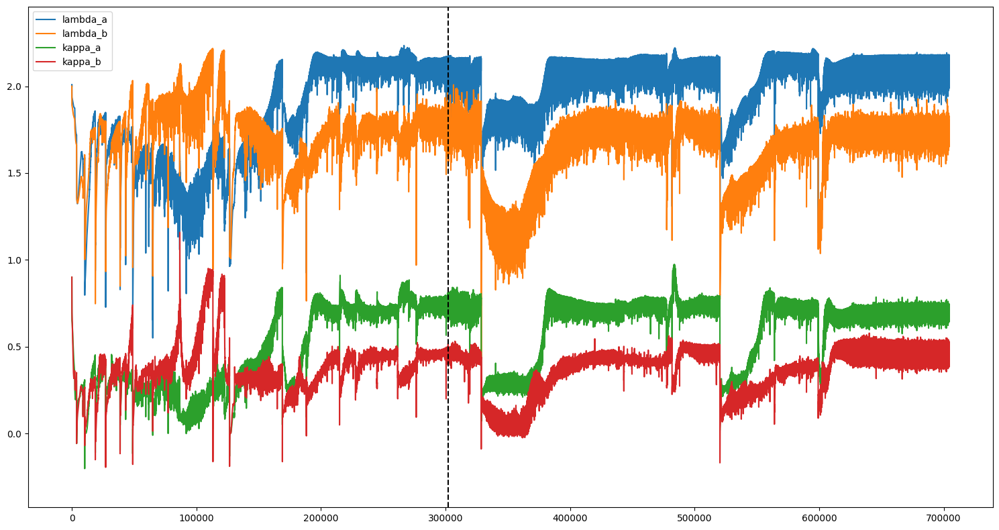

OverflowError: Exceeded cell block limit in Agg.  Please set the value of rcParams['agg.path.chunksize'], (currently 0) to be greater than 100 or increase the path simplification threshold(rcParams['path.simplify_threshold'] = 0.111111111111 by default and path.simplify_threshold = 0.111111111111 on the input).

<Figure size 1500x800 with 1 Axes>

In [ ]:
plot.show_known_and_prediction()
plot.plot_param_history()
plot.plot_loss_history()

In [ ]:
# from SIRD_normal_nn import SIRD_net
# max_timestep = 100000
# t_bool = t_synth < max_timestep
# t = t_synth[t_bool]
# wsol = solution_synth[t_bool]

# net = SIRD_net(t, wsol, init_num_people=1e6)
# net.train()
# net.plot(t_synth, solution_synth)

In [ ]:
# fig, ax = plt.subplots()
# net.plot(ax, t_synth)